
---

**Przedmiot:** Uczenie Głębokie<br>
**Moduł:** 3 (Reimplementacja modeli neuronowych)<br>
**Laboratoria:** 6<br>
**Opis laboratoriów:** Poniższy skrypt omawia kluczową funkcjonalność architektury Generative Adversarial Network oraz sposoby jej wykorzystania. W skrypcie przedstawione zostały kluczowe aspekty architektury niezbędne do poprawnej implementacji modelu neuronowego ale również informacje potrzebne do zrozumienia przeznaczenia architektury. Poprawna identyfikacja głównej funkcjonalności GAN jest niezbędna do dalszej pracy naukowej z klasą modeli GAN.

Wagi modelu są dostępne
[na Dysku Google](https://drive.google.com/file/d/1fJM2MgOaASc8km8k5o41fv9XAwzVrcpI/view?usp=sharing), są automatycznie pobierane poniżej.

---

### _Adversarial training is the coolest thing since sliced bread._ — Yan LeCun

# Funkcje pomocnicze

Do przećwiczenia zajęć potrzebna jest biblioteka PyTorch.

In [ ]:
!pip install kaggle kornia torcheval ema-pytorch lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 51.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 93.3 MB/s eta 0:00:00


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
from torchvision import datasets, transforms, io

from typing import Optional
from collections.abc import Callable
import matplotlib.pyplot as plt
from lpips import LPIPS

torch.set_float32_matmul_precision("high")
torch.backends.cudnn.benchmark = True

D: torch.nn.Module
G: torch.nn.Module
z: torch.Tensor
x: torch.Tensor

%load_ext tensorboard

/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)


In [ ]:
!gdown https://drive.google.com/uc?id=1fJM2MgOaASc8km8k5o41fv9XAwzVrcpI
!unzip -o ./ProjectedFastGAN.zip
!rm ./ProjectedFastGAN.zip

Downloading...
From (original): https://drive.google.com/uc?id=1fJM2MgOaASc8km8k5o41fv9XAwzVrcpI
From (redirected): https://drive.google.com/uc?id=1fJM2MgOaASc8km8k5o41fv9XAwzVrcpI&confirm=t&uuid=e03603d1-969d-445f-ba7d-55ddbead5d9f
To: /content/ProjectedFastGAN.zip
100% 258M/258M [00:06<00:00, 37.0MB/s]
Archive:  ./ProjectedFastGAN.zip
   creating: logs/ffhq_128/
   creating: logs/ffhq_128/state_dicts/
   creating: logs/ffhq_128/state_dicts/26/
  inflating: logs/ffhq_128/state_dicts/26/generator_ema.state_dict  
  inflating: logs/ffhq_128/events.out.tfevents.1767759068.Aurora.208141.0  


# Generative Adversarial Network

## Wprowadzenie

Początkowo, sieci neuronowe były głównie wykorzystywane do przeprowadzania pewnych decyzji bazując na danych wejściowych. Zazwyczaj były to decyzje związane z przypisaniem klasy bądź wartości zmiennoprzecinkowej do pewnego elementu pochodzącego z **próby losowej**.

Kolejnym etapem prac nad sieciami neuronowymi była próba znalezienia tym samym elementom **dobrej reprezentacji** zmiennoprzecinkowej, które następnie mogłyby służyć do takich celów jak zrozumienie relacji pomiędzy obiektami czy poprawa jakości algorytmów zbudowanych na ich podstawie.

Na tym etapie pojawiła się potrzeba zrozumienia nie tylko reprezentacji **elementów** pochodzących z **próby losowej** ale również samej **próby losowej**. Weźmy za przykład powszechnie znany zbiór MNIST. Składa się on z obrazów zawierających zapisane odręcznie cyfry. Obiekty w zbiorze naturalnie pochodzą z pewnego znacznie większego zbioru **wszystkich możliwych zapisanych odręcznie cyfr** - co naturalnie jest niemożliwe do pozyskania (z wyjątkiem dyskretnej formy obrazów jako pikseli). A więc:
- **populacja** - wszystkie możliwe pisma odręczne cyfr,
- **próba losowa** - podzbiór populacji (jak zbiór MNIST),
- **obiekty** - elementy populacji.

## Architektura

Jedną z pierwszych efektywnie działających architektur neuronowych zdolnych do uchwycenia przybliżonego rozkładu populacji był autoenkoder wariacyjny (VAE).

![3](https://drive.google.com/uc?export=view&id=13Q9hQAgTTz9MrXxuszvrg4O2caCwGIm5)

Zadaniem VAE było na podstawie obrazu wejściowego wyestymowanie **parametrów rozkładu normalnego, który przybliża rozkład tego obiektu w populacji**, a następnie pobierając losową próbkę z uzyskanego rozkładu odtworzenie obrazu wejściowego.

W tym podejściu uczyniono pierwszy krok w kierunku odnalezienia ogólnej reprezentacji pewnych klas obrazów w przybliżonym rozkładzie populacji.

**Ponownie, można więc zadać pytanie: czy jest możliwe zamodelowanie rozkładu populacji przy pomocy sieci neuronowych?**

W odpowiedzi na powyższe pytanie powstała architektura Generative Adversarial Network (GAN), która znalazła bardzo szerokie zastosowanie w obecnych badaniach nad AI. GAN podchodzi do sprawy od innej strony, zamiast estymować rozkład z danych wejściowych, uznaje, że pewna ustalona przestrzeń (np. dla 1D może to być przedział $<-1, 1>$) reprezentuje przestrzeń **na której zdefiniowany zostanie przybliżony rozkład populacji**. Intuicyjnie, GAN stara się działać tak jak człowiek, określając najpierw przestrzeń, a następnie prosząc generator o umiejscowienie obiektów na tej przestrzeni (tak jak w przykładzie z MNIST).

![4](https://drive.google.com/uc?export=view&id=1IGD5AMZsLebASQqqVpvT-ryyPacwAcV6)

Po procesie uczenia, możliwa jest identyfikacja obiektów w przestrzeni w którą sobie zdefiniowaliśmy:

![5](https://drive.google.com/uc?export=view&id=1_TtmjPwtcaI2AOBUkwxX56TTysz_G_9d)

**Należy więc pamiętać, że główną funkcjonalnością GAN nie jest generowanie danych (pomimo nazwy), a zdolność uchwycenia przybliżonego rozkładu populacji w dowolnie dobranej przestrzeni.**

Ogólna architektura GAN wygląda następująco:

![6](https://drive.google.com/uc?export=view&id=12rian2YHJMr0lo-brnYD3QSFSbEblPVS)

GAN składa się (wg. oryginalnej architektury) z dwóch głównych komponentów: **generatora** oraz **dyskryminatora**. Zadaniem generatora jest generowanie danych, które będą przypominały dane rzeczywiste, natomiast dyskryminator odpowiada za wydanie decyzji czy dane wejściowe pochodzą z prawdziwego rozkładu danych, czy z generatora.

Inspiracją do stworzenia architektury GAN jest problem szukania strategii optymalnej, znanej z **teorii gier**. Problem ten dotyczy gry losowej dla dwóch graczy, w której poszukiwana jest równowaga Nasha (t.j. taka strategia obu graczy, że żadnemu z nich nie opłaca się zmienić swojej strategii względem ustalonej strategii drugiego gracza).

Przekształcając problem poszukiwania równowagi Nasha na architekturę GAN, Goodfellow przedstawił sytuację jako grę pomiędzy generatorem a dyskryminatorem. Generator stara się oszukać dyskryminator generując takie dane, które będą nierozróżnialne z rzeczywistymi danymi, natomiast dyskryminator stara się jak najlepiej klasyfikować dane wejściowe.

Przy powyższej definicji problemu możemy zaproponować formalizację celu (oryginalnej) architektury jako:

$$
min_G max_D V(G,D) = E_x[log(D(x))] + E_z[log(1 - D(G(z)))]
$$

Gdzie $G$ to model generatora, a $D$ - dyskryminatora. Powyższy wzór możemy rozważać osobno dla generatora i dyskryminatora. Względem generatora powyższy wzór możemy opisać jako: **generuj przykłady, które maksymalizują wyjście dyskryminatora**, natomiast dla dyskryminatora: **maksymalizuj wyjście dla przykładów rzeczywistych i minimalizuj dla przykładów wygenerowanych**.

Przekształcając powyższe wzory na kod, otrzymujemy:

In [ ]:
if False:
    gen_loss = torch.log(1 - D(G(z)))

    disc_loss = -(torch.log(D(x)) + torch.log(1 - D(G(z))))
    # przemnożone przez -1 bo zmieniony kierunek optymalizacji

Inną implementacją zgodną z wcześniej przytoczonym opisem maksymalizacji i minimalizacji wyjścia dyskryminatora jest tzw. **Wasserstein loss**.

$$
min_G max_D V(G,D) = E_x[D(x)] + E_z[-D(G(z))]
$$

Implementacja Wasserstein loss:

In [ ]:
if False:
    gen_loss = -D(G(z))

    disc_loss = -D(x) + D(G(z))

Kolejnym rozszerzeniem może być inspirowane SVM zastosowanie **Hinge loss** (zmieniony kierunek optymalizacji we wzorze).

$$
min_D V(D) = E_x[max(0, 1 - D(x))] + E_z[max(0, 1 + D(G(z)))]
$$

In [ ]:
if False:
    gen_loss = -D(G(z))

    disc_loss = torch.max(0, 1 - D(x)) + torch.max(0, 1 + D(G(z)))

Obrazek poniżej przedstawia różnice pomiędzy klasycznym sformułowaniem GAN, a korzystającym z Wasserstein loss WGAN.

![7](https://drive.google.com/uc?export=view&id=1Z5yvclmaWrC5kmAlSbqqf_Pb4o8Ha9Zi)

Optymalny dyskryminator w klasycznym GANie znajduje poprawną granicę decyzyjną i staje się płaski w pozostałych obszarach modelowanej przestrzeni. Takie właściwości, chociaż pożądane przy klasycznym zadaniu klasyfikacji, stają się problemem podczas uczenia GAN. Płaski obszar na wyjściu dyskryminatora oznacza **zanik gradientu**, a więc brak możliwości uczenia generatora. Z drugiej strony zbyt duża zmienność wartości dyskryminatora może prowadzić do problemu **wybuchu gradientu** i zaburzyć proces uczenia.


### Warunek Lipschitza

Pożądaną właściwością dyskryminatora jest spełnianie warunku Lipschitza. Żeby funkcja $f$ spełniała warunek Lipschitza ze stałą $K$ musi istnieć stała $K \geq 0$ taka, że dla każdego $x_1, x_2$ spełniony jest warunek:

$$\lvert f(x_1) - f(x_2) \rvert \leq K \lvert x_1 - x_2 \rvert$$

co w praktyce oznacza, że norma gradientu na pewno będzie mniejsza niż $K$. Przez lata proponowano różne rozwiązania, które pozwalają spełnić ten warunek:

- przycinanie wag modelu do określonego zakresu wartości (Arjovsky et al., _Wasserstein Generative Adversarial Networks_, 2017), jak wspominają autorzy:
  > **Weight clipping is a clearly terrible way** to enforce a Lipschitz constraint. [...] However, we do leave the topic of enforcing Lipschitz constraints in a neural network setting for further investigation, and we actively encourage interested researchers to improve on this method.
- penalizacja normy gradientu (Gulrajani et al., _Improved Training of Wasserstein GANs_, 2017), polega na dodaniu komponentu funkcji straty, który wymusza zmniejszanie normy gradientu (wymaga liczenia gradientu po gradiencie)
- normalizacja spektralna wag modelu (Miyato et al., _Spectral Normalization for Generative Adversarial Networks_, 2018)


### Normalizacja spektralna

Można pokazać, że stała Lipschitza ($K$) dla funkcji liniowej $y = Wx + b$ jest równa normie spektralnej macierzy $W$, czyli $\sigma(W)$. W związku z tym, aby spełnić warunek Lipschitza ze stałą 1, wystarczy zastosować prostą sztuczkę:

$$W^\prime = \dfrac{W}{\sigma(W)}$$

Norma spektralna macierzy jest równa jej największej wartości szczególnej (singular value), intuicyjnie można o niej myśleć, że jest to największa "skala", o którą macierz może "rozciągnąć" wektor. Spróbujemy zaimplementować normalizację spektralną dla warstwy liniowej. Potem ze względu na wydajność będziemy korzystać z funkcji `spectral_norm` z paczki `torch.nn.utils.parametrizations`.

In [ ]:
# Norma spektralna macierzy


@torch.no_grad()
def spectral_matrix_norm(W: torch.Tensor):

    singular_values = torch.linalg.svdvals(W)
    sigma = torch.max(singular_values)

    # lub
    # sigma = torch.linalg.matrix_norm(W, ord=2)

    return sigma


# Warstwa liniowa ze spektralną normalizacją wag
class SpectralNormalizedLinear(nn.Module):
    def __init__(self, in_features: int, out_features: int, bias: float = 0.0):
        super().__init__()

        self.weight = nn.Parameter(torch.empty([out_features, in_features]))
        self.bias = nn.Parameter(torch.empty([out_features]))

        nn.init.normal_(self.weight)
        nn.init.constant_(self.bias, bias)

    def forward(self, x):
        return nn.functional.linear(x, self.weight / spectral_matrix_norm(self.weight), self.bias)


# nasza warstwa
# layer = SpectralNormalizedLinear(in_features, out_features)
# funkcjonalnie odpowiada
# layer = torch.nn.utils.parametrizations.spectral_norm(nn.Linear(in_features, out_features))
# ale jest bardziej kosztowna obliczeniowo

Mały test działania warstwy:

In [ ]:
num_vec = 128
vec_size = 128

# Losowe zbiory wektorów x1 i x2
x1 = torch.rand([1, num_vec, vec_size])
x2 = torch.rand([1, num_vec, vec_size])

# Odległości dla każdej pary wektorów z x1 i x2
# (rozmiar: 1 x num_vec x num_vec)
dist_x1_x2 = torch.cdist(x1, x2)

# -------------------------------------------------------------------------------------------
# Zwykła warstwa liniowa
linear = nn.Linear(vec_size, vec_size)
# "Niewyrafinowana" inicjalizacja parametrów warstwy
nn.init.normal_(linear.weight)
nn.init.constant_(linear.bias, 0)

y1 = linear(x1)
y2 = linear(x2)

# Odległości dla każdej pary wektorów z y1 i y2
dist_y1_y2 = torch.cdist(y1, y2)

print("Dla zwykłej warstwy liniowej:", torch.all(dist_y1_y2 <= dist_x1_x2))

# -------------------------------------------------------------------------------------------
# Warstwa liniowej z normalizacją spektralną
linear = SpectralNormalizedLinear(vec_size, vec_size)
# Inicjalizacja parametrów warstwy z takiego samego rozkładu
# (jest w konstruktorze klasy, niepotrzebnie powtórzone)
nn.init.normal_(linear.weight)
nn.init.constant_(linear.bias, 0)

y1 = linear(x1)
y2 = linear(x2)

# Odległości dla każdej pary wektorów z y1 i y2
dist_y1_y2 = torch.cdist(y1, y2)

# -------------------------------------------------------------------------------------------
print("Dla warstwy liniowej z normalizacją spektralną:", torch.all(dist_y1_y2 <= dist_x1_x2))

Dla zwykłej warstwy liniowej: tensor(False)
Dla warstwy liniowej z normalizacją spektralną: tensor(True)


# Implementacja GAN

Spróbujemy zaimplementować Projected GAN [1] korzystający z generatora FastGAN [2].

1. A. Sauer et al., _Projected GANs Converge Faster_, 2021
2. B. Liu et al., _Towards Faster and Stabilized GAN Training for High-fidelity Few-shot Image Synthesis_, 2021

## Generator


Architektura FastGAN wygląda następująco:

![8](https://drive.google.com/uc?export=view&id=1FaKaQBDFdQPtPTZTMOpLhiUPWewEPw5Z)

In [ ]:
from torch.nn.utils.parametrizations import spectral_norm


class UpsampleBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.seq = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            spectral_norm(nn.Conv2d(in_channels, out_channels * 2, kernel_size=3, bias=False, padding="same", padding_mode="zeros")),
            nn.BatchNorm2d(out_channels * 2),
            nn.GLU(dim=1),
        )

    def forward(self, x: torch.Tensor):
        return self.seq(x)

In [ ]:
class NoiseInjection(nn.Module):
    def __init__(self):
        super().__init__()

        self.weight = nn.Parameter(torch.empty([1]), requires_grad=True)
        nn.init.constant_(self.weight, 0)

    def forward(self, x):
        batch_size, _, height, width = x.shape
        noise = torch.randn([batch_size, 1, height, width], device=x.device)
        return x + self.weight * noise


class UpsampleBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.seq = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            spectral_norm(nn.Conv2d(in_channels, out_channels * 2, kernel_size=3, bias=False, padding="same", padding_mode="zeros")),
            NoiseInjection(),
            nn.BatchNorm2d(out_channels * 2),
            nn.GLU(dim=1),

            spectral_norm(nn.Conv2d(out_channels, out_channels * 2, kernel_size=3, bias=False, padding="same", padding_mode="zeros")),
            NoiseInjection(),
            nn.BatchNorm2d(out_channels * 2),
            nn.GLU(dim=1),
        )

    def forward(self, x: torch.Tensor):
        return self.seq(x)

![9](https://drive.google.com/uc?export=view&id=1BERFJWsXdFkiJldhp1WSoExyr8rVc_RH)

In [ ]:
class SkipLayerExcitationBlock(nn.Module):
    def __init__(self, in_channels_1: int, in_channels_2: int):
        super().__init__()

        self.seq = nn.Sequential(
            nn.AdaptiveAvgPool2d(4),
            spectral_norm(nn.Conv2d(in_channels_2, in_channels_1, kernel_size=4, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            spectral_norm(nn.Conv2d(in_channels_1, in_channels_1, kernel_size=1, bias=False)),
            nn.Sigmoid(),
        )

    def forward(self, x1, x2):
        return x1 * self.seq(x2)

In [ ]:
class Generator(nn.Module):
    def __init__(
        self,
        in_features: int = 256,
        log_target_size: int = 10,
        first_sle: int = 0,
        last_sle: int = 3,
        sle_step: int = 4,
    ):
        super().__init__()

        self.in_features = in_features
        channels = [1024, 512, 256, 128, 128, 64, 32, 16, 8]

        self.mapping = nn.Sequential(
            nn.Unflatten(-1, [in_features, 1, 1]),
            spectral_norm(nn.ConvTranspose2d(in_features, channels[0] * 2, kernel_size=4, bias=False)),
            nn.BatchNorm2d(channels[0] * 2),
            nn.GLU(dim=1),
        )

        up_blocks = []
        sle_blocks = {}
        self.sle_first_input = set()
        self.sle_second_input = set()

        for i in range(log_target_size - 2):
            block = UpsampleBlock(channels[i], channels[i + 1])
            up_blocks.append(block)

            if i >= first_sle and i <= last_sle:
                i_next = i + sle_step

                self.sle_first_input.add(i)
                self.sle_second_input.add(i_next)

                block = SkipLayerExcitationBlock(channels[i_next], channels[i])
                sle_blocks[str(i_next)] = block

        self.up_blocks = nn.ModuleList(up_blocks)
        self.sle_blocks = nn.ModuleDict(sle_blocks)

        self.to_rgb = spectral_norm(nn.Conv2d(channels[log_target_size - 2], 3, kernel_size=3, bias=True, padding="same", padding_mode="zeros"))
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = x * (x.square().mean(dim=-1, keepdim=True) + 1e-8).rsqrt()
        x = self.mapping(x)

        old_x = []
        for i, up_block in enumerate(self.up_blocks):
            if i in self.sle_second_input:
                # print("connecting:", x.shape, old_x[0].shape)
                x = self.sle_blocks[str(i)](x, old_x.pop(0))

            if i in self.sle_first_input:
                old_x.append(x)

            x = up_block(x)

        i += 1
        if i in self.sle_second_input:
            # print("connecting:", x.shape, old_x[0].shape)
            x = self.sle_blocks[str(i)](x, old_x.pop(0))

        x = self.to_rgb(x)
        x = self.sigmoid(x)

        return x

In [ ]:
generator = Generator(log_target_size=7, sle_step=3)
generator(torch.randn([1, 256])).shape

torch.Size([1, 3, 128, 128])

## Dyskryminator

![9](https://drive.google.com/uc?export=view&id=1kK_4ZCS_boCdPc30MU94v6SXF4x-BOnA)

Do załadowania zagnieżdżonej sieci przewidującej cechy obrazu skorzystamy z biblioteki `timm` i modeli EfficientNet Lite [https://huggingface.co/docs/timm/models/tf-efficientnet-lite](https://huggingface.co/docs/timm/models/tf-efficientnet-lite) oraz Distilled data-efficient Image Transformer  [https://huggingface.co/timm/deit_tiny_distilled_patch16_224.fb_in1k](https://huggingface.co/timm/deit_tiny_distilled_patch16_224.fb_in1k)

Skorzystamy z połączenia dwóch dyskryminatorów przedstawionego w [3].

3. A. Sauer et al., _StyleGAN-XL: Scaling StyleGAN to Large Diverse Datasets_, 2022

In [ ]:
class DownsampleBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.seq1 = nn.Sequential(
            spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, bias=False, padding=1, padding_mode="zeros")),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
            spectral_norm(nn.Conv2d(out_channels, out_channels, kernel_size=3, bias=False, padding="same", padding_mode="zeros")),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x: torch.Tensor):
        return self.seq1(x)

In [ ]:
class DiscriminatorHead(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, channels: dict[int], in_size: int, out_size: int):
        super().__init__()

        down_blocks = []
        size = in_size
        while size > out_size:
            down_block = DownsampleBlock(channels[size], channels[size // 2])
            size = size // 2
            down_blocks.append(down_block)

        self.seq = nn.Sequential(
            nn.BatchNorm2d(in_channels),
            spectral_norm(nn.Conv2d(in_channels, channels[in_size], kernel_size=3, bias=False, padding="same", padding_mode="zeros")),
            nn.LeakyReLU(0.2, inplace=True),
            *down_blocks,
            spectral_norm(nn.Conv2d(channels[out_size], out_channels, kernel_size=3, bias=False, padding="same", padding_mode="zeros"))
        )

    def forward(self, x: torch.Tensor):
        return self.seq(x)

In [ ]:
class CCM(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.conv = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False))
        self.bn = nn.BatchNorm2d(in_channels)

        self.conv.requires_grad_(False)

    def forward(self, x: torch.Tensor):
        return self.bn(self.conv(x))


class CSM(nn.Module):
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()

        self.conv = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False))
        self.bn = nn.BatchNorm2d(out_channels)
        self.up = nn.Upsample(scale_factor=2, mode="nearest")

        self.conv.requires_grad_(False)

    def forward(self, x: torch.Tensor):
        return self.up(self.bn(self.conv(x)))

In [ ]:
import timm
from kornia.enhance.normalize import Normalize
from kornia.geometry.transform import Resize

class Discriminator(nn.Module):
    def __init__(self, model: str, input_size: int, indices: tuple[int]):
        super().__init__()

        kwargs = {}
        if "deit" in model:
            kwargs["dynamic_img_size"] = True

        self.feature_net: nn.Module = timm.create_model(model, pretrained=True, **kwargs)

        channels_dict = {2: 1024, 4: 1024, 8: 512, 16: 256, 32: 128, 64: 128, 128: 64, 256: 32, 512: 16, 1024: 8}

        class FakeDict:
            def __getitem__(self, channel):
                return channels_dict[min(channels_dict.keys(), key=lambda k: abs(k - channel))]

        channels = FakeDict()

        self.indices = indices
        self.transform = nn.Sequential(Resize(input_size), Normalize(mean=self.feature_net.default_cfg["mean"], std=self.feature_net.default_cfg["std"]))

        feature_maps = self.feature_net.forward_intermediates(torch.empty([1, 3, input_size, input_size]), intermediates_only=True, indices=self.indices)
        heads = []
        #ccm = []
        #csm = []
        #last_in_channels = None
        for feature_map in feature_maps:
            _, in_channels, in_size, _ = feature_map.shape
            #ccm.append(CCM(in_channels, in_channels))
            #csm.append(CSM(in_channels, last_in_channels) if last_in_channels != None else nn.Identity())
            heads.append(DiscriminatorHead(in_channels, 1, channels, in_size, 4))
            #last_in_channels = in_channels

        self.heads = nn.ModuleList(heads)
        #self.ccm = nn.ModuleList(ccm)
        #self.csm = nn.ModuleList(csm)

        self.feature_net.requires_grad_(False)

    def forward(self, x):
        x = self.transform(x)
        feature_maps = self.feature_net.forward_intermediates(x, intermediates_only=True, indices=self.indices)

        logits = []
        # last_feature_map = None
        for feature_map, head in reversed(list(zip(feature_maps, self.heads))): #, self.ccm, self.csm))):
            # feature_map = ccm(feature_map)

            # if last_feature_map != None:
            #    feature_map = (feature_map + last_feature_map)/2

            logits.append(head(feature_map))

            # last_feature_map = csm(feature_map)

        logits = torch.cat(logits, dim=1)
        return logits

class CombinedDiscriminator(nn.Module):
    def __init__(self, input_size: int = 128, indices=(1, 2), models: str = ["tf_efficientnet_lite0", "deit_tiny_distilled_patch16_224"]):
        super().__init__()
        self.models = nn.ModuleList([Discriminator(model=model, input_size=input_size, indices=indices) for model in models])

    def forward(self, x):
        logits = torch.cat([model(x) for model in self.models], dim=1)
        return logits

In [ ]:
discriminator = CombinedDiscriminator(input_size=128)

discriminator(torch.rand([1, 3, 128, 128])).shape

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/18.8M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/23.7M [00:00<?, ?B/s]

torch.Size([1, 4, 4, 4])

# Zbiór danych

Skorzystamy ze zbioru Flickr-Faces-HQ Dataset (FFHQ).

In [ ]:
import os
from google.colab import userdata

os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

!kaggle datasets download imcr00z/flickr-faces-70k-thumbnails-128x128
!unzip -q flickr-faces-70k-thumbnails-128x128.zip
!rm flickr-faces-70k-thumbnails-128x128.zip

Dataset URL: https://www.kaggle.com/datasets/imcr00z/flickr-faces-70k-thumbnails-128x128
License(s): unknown
 98% 1.93G/1.97G [00:26<00:00, 186MB/s]
100% 1.97G/1.97G [00:26<00:00, 80.3MB/s]


In [ ]:
import glob

class CustomImageDataset(data.Dataset):
    def __init__(self, paths: list[str], transform=None):
        self.paths = paths
        self.transform = transform or (lambda x: x)

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, i):
        return self.transform(io.read_image(self.paths[i], mode=io.ImageReadMode.RGB)), 0



def prepare_dataset_ffhq(split: str = "train"):
    transform = transforms.Compose(
        [
            transforms.Resize(128, antialias=True),
            transforms.Lambda(lambda x: x.to(torch.float32) / 255),
        ]
    )
    path = "thumbnails128x128"
    paths = list(glob.glob(f"{path}/*.png"))
    paths.sort()

    splitting_idx = 60_000
    if split == "train":
        paths = paths[:splitting_idx]
    else:
        paths = paths[splitting_idx:]

    dataset = CustomImageDataset(paths=paths, transform=transform)
    return dataset


def prepare_dataloader(dataset: data.Dataset, batch_size: int = 64, num_workers: int = 2, shuffle: bool = True):
    dataloader = data.DataLoader(dataset, batch_size=batch_size, num_workers=num_workers, drop_last=True)
    return dataloader

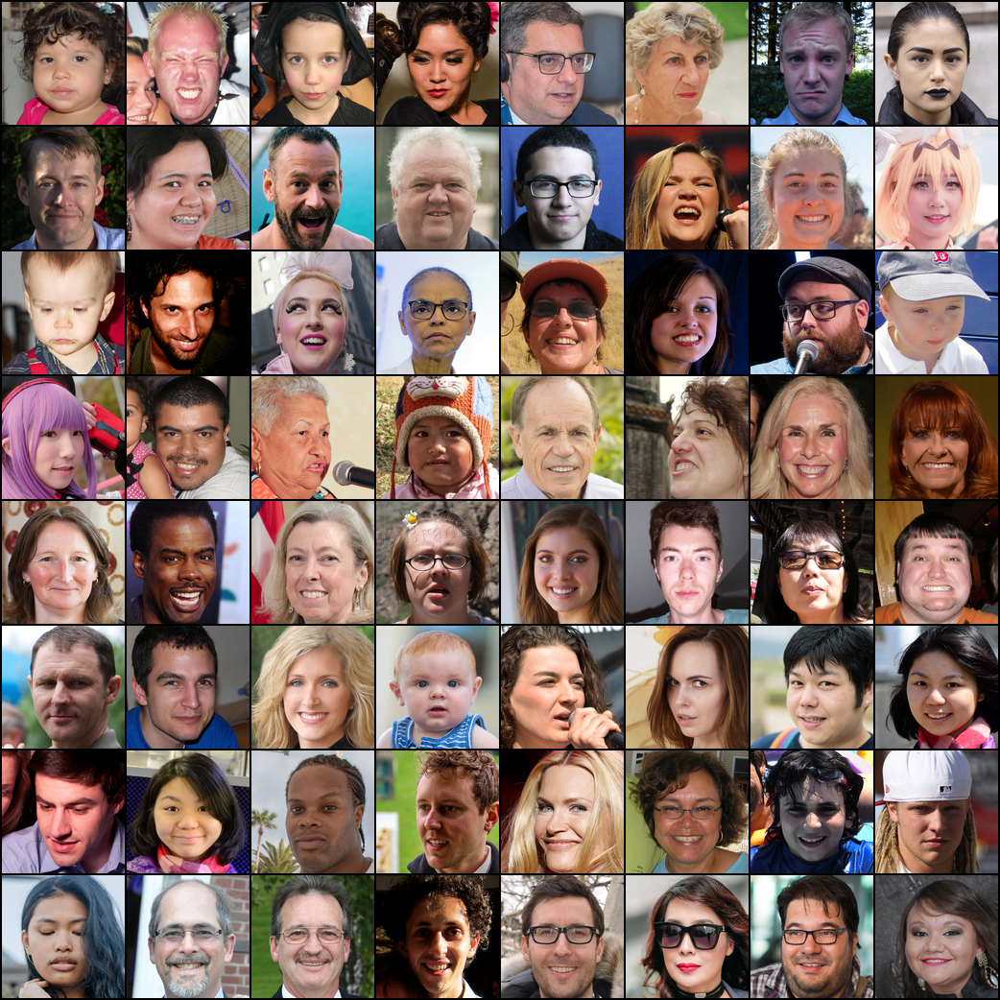

In [ ]:
from IPython.display import display
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid

images = next(iter(prepare_dataloader(prepare_dataset_ffhq(split="test"), shuffle=False)))[0][:64]

display(to_pil_image(make_grid(images)))

# Fréchet inception distance

FID jest metryką służącą do oceniania jakości modeli generatywnych. Polega na mierzeniu odległości pomiędzy rozkładami cech dwóch zbiorów obrazów.

$$f_{Inception}(X_1) \sim \mathcal{N}(\mu_1, C_1)$$
$$f_{Inception}(X_2) \sim \mathcal{N}(\mu_2, C_2)$$

Odległość Frécheta pomiędzy dwoma rozkładami normalnymi:
$$
d_F(\mathcal{N}(\mu_1, C_1),\, \mathcal{N}(\mu_2, C_2)) = ||\mu_1 - \mu_2||^2_2 + Tr(C_1 + C_2 - 2(C_1C_2)^\frac{1}{2})
$$

# Uczenie modelu

In [ ]:
def mean_relu(x: torch.Tensor):
    return torch.mean(nn.functional.relu(x))


def train_step(
    noise_size: int,
    real_images: torch.Tensor,
    generator: Generator,
    discriminator: Discriminator,
    gen_optimizer: optim.Optimizer,
    disc_optimizer: optim.Optimizer,
    aug: nn.Module,
):
    batch_size = real_images.shape[0]
    device = real_images.device

    gen_optimizer.zero_grad(set_to_none=True)
    disc_optimizer.zero_grad(set_to_none=True)

    with torch.no_grad():
        noise = torch.randn([batch_size, noise_size], device=device)
        fake_images = generator(noise)

    fake_score = discriminator(aug(fake_images.detach()))
    real_score = discriminator(aug(real_images))

    disc_loss = mean_relu(torch.ones_like(fake_score) + fake_score) + mean_relu(torch.ones_like(real_score) - real_score)

    disc_loss.backward()
    disc_optimizer.step()

    noise = torch.randn([batch_size, noise_size], device=device)
    fake_images = generator(noise)

    fake_score = discriminator(aug(fake_images))
    gen_loss = -torch.mean(fake_score)

    gen_loss.backward()
    gen_optimizer.step()

    return disc_loss.item(), gen_loss.item()

In [ ]:
import os
import numpy as np
from tqdm import tqdm

from kornia import augmentation
from kornia.constants import SamplePadding

from torcheval.metrics import FrechetInceptionDistance
from ema_pytorch import EMA
from torch.utils.tensorboard import SummaryWriter

In [ ]:
log_dir="logs/ffhq_128_colab"
writer = SummaryWriter(log_dir=log_dir)

device = "cuda:0"

epochs = 0
batch_size = 64
learning_rate = 0.0002
noise_size = 256
betas = (0.0, 0.99)

generator = Generator(in_features=noise_size, log_target_size=7).to(device)
generator_ema = EMA(generator, beta=0.9999, update_after_step=10, update_every=1)

discriminator = CombinedDiscriminator(input_size=128).to(device)

gen_optimizer = torch.optim.Adam(generator.parameters(), lr=learning_rate, betas=betas)
disc_optimizer = torch.optim.Adam(discriminator.parameters(), lr=learning_rate, betas=betas)

generator_compiled = generator #torch.compile(generator)
discriminator_compiled = discriminator #torch.compile(discriminator)



dataset = prepare_dataset_ffhq(split="train")
dataloader = prepare_dataloader(dataset, batch_size=batch_size)
val_dataloader = prepare_dataloader(prepare_dataset_ffhq(split="val"), batch_size=batch_size)


def train_loop():
    fid_cache = FrechetInceptionDistance(device=device)

    for real_images, _ in tqdm(val_dataloader):
        real_images.to(device)
        fid_cache.update(real_images, is_real=True)

    aug = augmentation.AugmentationSequential(
        augmentation.RandomHorizontalFlip(p=0.5),
        augmentation.RandomAffine(degrees=5, translate=None, p=0.5, padding_mode=SamplePadding.REFLECTION),
        augmentation.RandomAffine(degrees=0, translate=(0.01, 0.01), p=0.5, padding_mode=SamplePadding.REFLECTION),
        random_apply=2,
    )

    for epoch in range(epochs):
        print(f"\nEpoch {epoch}")

        loop = tqdm(dataloader)

        generator_compiled.train()
        discriminator_compiled.train()

        disc_losses = []
        gen_losses = []

        for step, (real_images, _) in enumerate(loop):
            real_images = real_images.to(device)
            disc_loss, gen_loss = train_step(noise_size, real_images, generator_compiled, discriminator_compiled, gen_optimizer, disc_optimizer, aug)
            disc_losses.append(disc_loss)
            gen_losses.append(gen_loss)
            loop.set_postfix(disc_loss=disc_loss, gen_loss=gen_loss)
            generator_ema.update()

            if step == 10:
                # Wczesne zatrzymanie dla przykładu na Google Colab
                break

        writer.add_scalar("Loss/discriminator", np.mean(disc_losses), epoch)
        writer.add_scalar("Loss/generator", np.mean(gen_losses), epoch)


        with torch.no_grad():
            save_dir = f"{log_dir}/state_dicts/{epoch}"
            os.makedirs(save_dir)
            torch.save(generator.state_dict(), f"{save_dir}/generator.state_dict")
            torch.save(generator_ema.state_dict(), f"{save_dir}/generator_ema.state_dict")
            torch.save(discriminator.state_dict(), f"{save_dir}/discriminator.state_dict")
            torch.save(gen_optimizer.state_dict(), f"{save_dir}/gen_optimizer.state_dict")
            torch.save(disc_optimizer.state_dict(), f"{save_dir}/disc_optimizer.state_dict")

            for g, name in [(generator, "generator"), (generator_ema, "generator_ema")]:
                g.train()
                for _ in tqdm(range(128)):
                    noise = torch.randn([64, noise_size], device=device)
                    fake_images = g(noise)
                g.eval()

                noise = torch.randn([16, noise_size], device=device)
                fake_images = g(noise)
                grid = make_grid(fake_images)
                display(to_pil_image(grid))
                writer.add_image(f"Samples/{name}", grid, epoch)

                fid = FrechetInceptionDistance(device=device)
                fid.merge_state([fid_cache])

                for _ in tqdm(range(len(val_dataloader))):
                    noise = torch.randn([batch_size, noise_size], device=device)
                    fid.update(g(noise), is_real=False)

                fid_value = fid.compute().item()
                print(name, "fid:", fid_value)
                writer.add_scalar(f"FID/{name}", fid_value, epoch)

    writer.close()

In [ ]:
train_loop()

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 221MB/s] 
100%|██████████| 156/156 [00:37<00:00,  4.12it/s]


In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
log_dir="logs/ffhq_128"
epoch_to_load = 26

save_dir = f"{log_dir}/state_dicts/{epoch_to_load}"

loaded_generator_ema_state = torch.load(f"{save_dir}/generator_ema.state_dict")
generator_ema.load_state_dict(loaded_generator_ema_state)

# Jest jakiś problem z zapisywaniem wag BatchNorm
# Liczymy je sobie od nowa:

generator_ema.train()
for _ in tqdm(range(128)):
    noise = torch.randn([batch_size, noise_size], device=device)
    fake_image = generator_ema(noise)

generator_ema.eval()
pass

# TODO: sprawdzić dlaczego, naprawić

100%|██████████| 128/128 [00:30<00:00,  4.22it/s]


# Generowanie obrazów

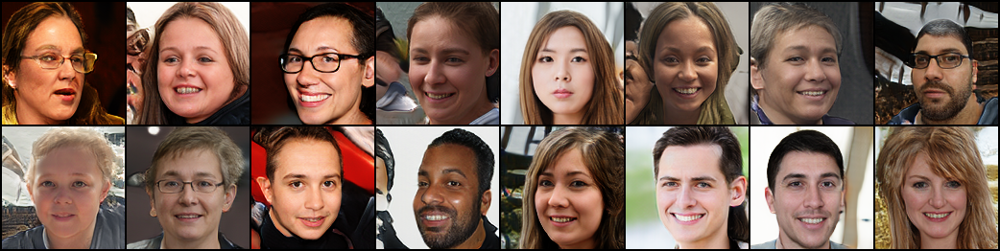

In [ ]:
with torch.no_grad():
    noise = torch.randn([16, noise_size], device=device)
    fake_images = generator_ema(noise)
    grid = make_grid(fake_images)
    display(to_pil_image(grid))

# _Latent Inversion_

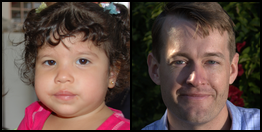

In [ ]:
images = next(iter(prepare_dataloader(prepare_dataset_ffhq(split="test"), shuffle=False)))[0][:64]
image_a = images[None, 0]
image_b = images[None, 8]
display(to_pil_image(make_grid(torch.cat((image_a, image_b), dim=0))))

In [ ]:
percept_loss = LPIPS().to(device)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 188MB/s]


Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth


In [ ]:
def find_best_starting_z(generator, target, num_batch=64, num_batches=32):
    best_z = None
    best_loss = float('inf')

    with torch.no_grad():
        for i in range(num_batches):
            z_candidates = torch.randn([num_batch, noise_size], device=device)

            gen_candidates = generator(z_candidates)

            target_batch = target.expand(num_batch, -1, -1, -1)

            gen_norm = gen_candidates * 2 - 1
            target_norm = target_batch * 2 - 1

            loss_lpips = percept_loss(gen_norm, target_norm).view(num_batch)
            loss_mse = nn.functional.mse_loss(gen_candidates, target_batch, reduction='none').mean(dim=[1, 2, 3])

            total_loss = 0.1 * loss_lpips + loss_mse

            min_loss_val, min_idx = torch.min(total_loss, dim=0)
            if min_loss_val < best_loss:
                best_loss = min_loss_val.item()
                best_z = z_candidates[min_idx].unsqueeze(0).clone()
                print(f"Batch {i+1}: New best loss found: {best_loss:.4f}")

        return best_z

In [ ]:
def latent_inversion(
    generator,
    target_image,
    steps=1000,
    lr=0.1
):
    target = target_image.detach().to(device)

    best_z = find_best_starting_z(generator, target)
    z_opt = best_z.clone().detach().requires_grad_(True)

    with torch.no_grad():
        generated_image = generator(z_opt)
        display(to_pil_image(generated_image[0]))

    optimizer = optim.Adam([z_opt], lr=lr)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=steps)

    print(f"Starting inversion for {steps} steps...")

    for step in range(steps):
        optimizer.zero_grad()

        generated_image = generator(z_opt)

        gen_norm = generated_image * 2 - 1
        target_norm = target * 2 - 1

        loss_lpips_val = percept_loss(gen_norm, target_norm).mean()
        loss_mse_val = nn.functional.mse_loss(generated_image, target)

        loss = 0.1 * loss_lpips_val + loss_mse_val

        loss.backward()
        optimizer.step()
        scheduler.step()

        if (step < 80 and (step + 1) % 20 == 0) or (step >= 80 and (step + 1) % 500 == 0):
            print(f"Step {step+1}/{steps} | Loss: {loss.item():.4f} (LPIPS: {loss_lpips_val.item():.4f}, MSE: {loss_mse_val.item():.4f})")
            display(to_pil_image(generated_image[0]))

    return z_opt.detach(), generated_image.detach()

Batch 1: New best loss found: 0.0827
Batch 3: New best loss found: 0.0723


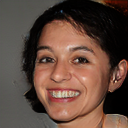

Starting inversion for 1000 steps...
Step 20/1000 | Loss: 0.0593 (LPIPS: 0.3230, MSE: 0.0270)


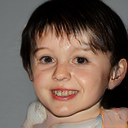

Step 40/1000 | Loss: 0.0524 (LPIPS: 0.2928, MSE: 0.0231)


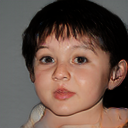

Step 60/1000 | Loss: 0.0487 (LPIPS: 0.2675, MSE: 0.0220)


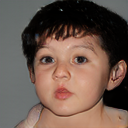

Step 80/1000 | Loss: 0.0397 (LPIPS: 0.2142, MSE: 0.0183)


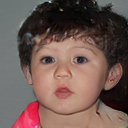

Step 500/1000 | Loss: 0.0200 (LPIPS: 0.0951, MSE: 0.0105)


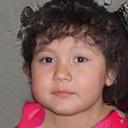

Step 1000/1000 | Loss: 0.0193 (LPIPS: 0.0918, MSE: 0.0101)


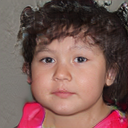

In [ ]:
inverted_noise_a, reconstructed_img_a = latent_inversion(
    generator=generator_ema,
    target_image=image_a
)

Batch 1: New best loss found: 0.0688
Batch 5: New best loss found: 0.0687
Batch 15: New best loss found: 0.0685
Batch 16: New best loss found: 0.0679


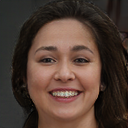

Starting inversion for 1000 steps...
Step 20/1000 | Loss: 0.0364 (LPIPS: 0.2134, MSE: 0.0150)


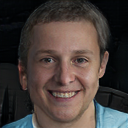

Step 40/1000 | Loss: 0.0321 (LPIPS: 0.1880, MSE: 0.0133)


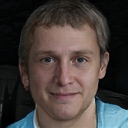

Step 60/1000 | Loss: 0.0279 (LPIPS: 0.1680, MSE: 0.0111)


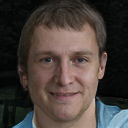

Step 80/1000 | Loss: 0.0249 (LPIPS: 0.1447, MSE: 0.0104)


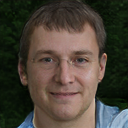

Step 500/1000 | Loss: 0.0202 (LPIPS: 0.1165, MSE: 0.0086)


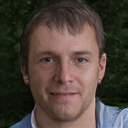

Step 1000/1000 | Loss: 0.0197 (LPIPS: 0.1126, MSE: 0.0084)


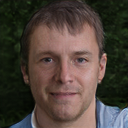

In [ ]:
inverted_noise_b, reconstructed_img_b = latent_inversion(
    generator=generator_ema,
    target_image=image_b
)

# Interpolacja w przestrzeni ukrytej

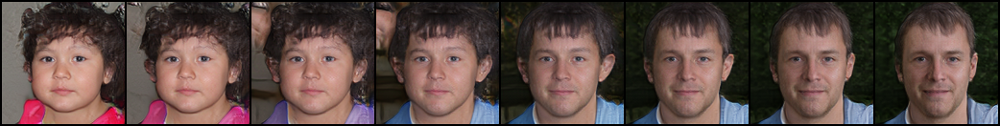

In [ ]:
t = torch.linspace(0, 1, steps=8, device=device).view(-1, 1)
latents = inverted_noise_a * (1 - t) + inverted_noise_b * t

display(to_pil_image(make_grid(generator_ema(latents).cpu())))